# Data science for Crime Prediction

Datasets used:
1.	Toronto Police Open Data Portal MCI 2014 to 2019 dataset: https://data.torontopolice.on.ca/datasets/mci-2014-to-2019
2.	Toronto Police Open Data Portal KSI 2006 to 2019 dataset: https://data.torontopolice.on.ca/datasets/ksi
3.	City of Toronto Open Data Portal Wellbeing Toronto – Youth Services 2016: https://open.toronto.ca/dataset/wellbeing-toronto-youth-services/ 
4.	City of Toronto Open Data Portal – Places of Worship 2006:      https://open.toronto.ca/dataset/places-of-worship/
5.	City of Toronto Open Data Portal – Community Housing 2019:  https://open.toronto.ca/dataset/toronto-community-housing-data/ 
6.	City of Toronto Open Data Portal – Social Housing Unit Density 2014:  https://open.toronto.ca/dataset/social-housing-unit-density-by-neighbourhoods/ 
7.	Toronto Police Open Data Portal - Neighbourhood Crime Rates 2014 - 2019 https://data.torontopolice.on.ca/pages/catalogue 
8.	Toronto Police Open Data Portal Catalogue – Police Facilities locations file https://data.torontopolice.on.ca/pages/catalogue 


## Dependent Variable
### Major Crime Indicators (MCIs) - MCI 2014 to 2019

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import seaborn as sn

py.init_notebook_mode(connected=True)

In [2]:
df = pd.read_csv('1_open_Data\MCI_2014_to_2019.csv',parse_dates=['occurrencedate'])

#### Number of records

In [3]:
df.shape

(206435, 30)

#### Fields

In [4]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,7.0,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5


#### Count of records per year

In [5]:
df.groupby('occurrenceyear')['event_unique_id'].count()

occurrenceyear
2000.0       14
2001.0       13
2002.0        9
2003.0       10
2004.0       15
2005.0       17
2006.0        8
2007.0       24
2008.0       35
2009.0       49
2010.0       75
2011.0       91
2012.0      159
2013.0      536
2014.0    31638
2015.0    32316
2016.0    32809
2017.0    34561
2018.0    36323
2019.0    37674
Name: event_unique_id, dtype: int64

## filter for 2014-2019

In [6]:
df = df[df['occurrenceyear'] >= 2014]

In [7]:
df['occurrenceyear'].unique()

array([2014., 2015., 2016., 2017., 2018., 2019.])

In [8]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,7.0,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,7.0,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5


#### Number of records after filter

In [9]:
df.shape

(205321, 30)

#### Check for nulls

In [10]:
df.isnull().sum()

X                      0
Y                      0
Index_                 0
event_unique_id        0
occurrencedate         0
occ_date               0
reporteddate           0
premisetype            0
ucr_code               0
ucr_ext                0
offence                0
reportedyear           0
reportedmonth          0
reportedday            0
reporteddayofyear      0
reporteddayofweek      0
reportedhour           0
occurrenceyear         0
occurrencemonth        0
occurrenceday          0
occurrencedayofyear    0
occurrencedayofweek    0
occurrencehour         0
MCI                    0
Division               0
Hood_ID                0
Neighbourhood          0
Lat                    0
Long                   0
ObjectId               0
dtype: int64

### MCI Descriptive statistics

In [11]:
df.describe()

,X,Y,Index_,ucr_code,ucr_ext,reportedyear,reportedday,reporteddayofyear,reportedhour,occurrenceyear,occurrenceday,occurrencedayofyear,occurrencehour,Hood_ID,Lat,Long,ObjectId
count,2.053210e+05,2.053210e+05,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000,205321.000000
mean,-8.838215e+06,5.420264e+06,103443.021245,1697.213807,146.077912,2016.626833,15.748711,187.394451,12.832345,2016.607035,15.546023,186.552579,12.576775,72.210086,43.707322,-79.395037,103442.851769
std,1.161402e+04,8.117647e+03,59529.664987,323.552963,51.749843,1.714717,8.769403,103.537580,6.590369,1.712493,8.882357,103.724321,7.208911,40.749973,0.052708,0.104331,59529.844943
min,-8.865373e+06,5.401765e+06,1.000000,1410.000000,100.000000,2014.000000,1.000000,1.000000,0.000000,2014.000000,1.000000,1.000000,0.000000,1.000000,43.587093,-79.639000,1.000000
25%,-8.846671e+06,5.413154e+06,52045.000000,1430.000000,100.000000,2015.000000,8.000000,100.000000,8.000000,2015.000000,8.000000,99.000000,7.000000,36.000000,43.661152,-79.471000,52046.000000
50%,-8.837988e+06,5.419301e+06,103522.000000,1450.000000,100.000000,2017.000000,16.000000,189.000000,14.000000,2017.000000,16.000000,188.000000,14.000000,76.000000,43.701092,-79.393000,103522.000000
75%,-8.829862e+06,5.427154e+06,154958.000000,2120.000000,200.000000,2018.000000,23.000000,277.000000,18.000000,2018.000000,23.000000,276.000000,19.000000,108.000000,43.752068,-79.320000,154958.000000
max,-8.807932e+06,5.442380e+06,206435.000000,2135.000000,230.000000,2019.000000,31.000000,366.000000,23.000000,2019.000000,31.000000,366.000000,23.000000,140.000000,43.850788,-79.123000,206435.000000


#### Number of neighbourhoods in Toronto

In [12]:

df['Neighbourhood'].nunique()

140

#### Crime occurrences over time

In [13]:
crime_date = df.groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

crime_date.head()

,occurrenceyear,occurrencemonth,occurrencedate,count
4,2014.0,January,2014-01-01 05:00:00+00:00,2448
3,2014.0,February,2014-02-01 05:00:00+00:00,2203
7,2014.0,March,2014-03-01 05:00:00+00:00,2420
0,2014.0,April,2014-04-01 04:00:00+00:00,2509
8,2014.0,May,2014-05-01 04:00:00+00:00,2856


In [14]:
data = go.Scatter(x=crime_date['occurrencedate'], y=crime_date['count'])

py.iplot([data])

### MCIs by DIvision

In [15]:
div_yr = df.groupby(['Division', 'occurrenceyear'])['event_unique_id'].count().unstack()
div_yr

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
Division,,,,,,
D11,1242,1392,1288,1364,1518,1535
D12,1472,1467,1518,1454,1470,1484
D13,1083,1136,1196,1243,1326,1390
D14,2284,2276,2461,2601,2689,2833
D22,1982,2000,2004,2087,2246,2225
D23,2064,2069,2250,2258,2473,2311
D31,2227,2299,2406,2554,2568,2871
D32,2343,2263,2477,2625,2797,2792
D33,1527,1530,1458,1533,1526,1624


#### Descriptive statistics by Division

In [16]:
div_yr.describe()

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000
mean,1861.058824,1900.941176,1929.941176,2033.000000,2136.647059,2216.117647
std,476.935854,473.521313,512.643818,589.437338,608.352790,667.886300
min,1083.000000,1136.000000,1196.000000,1243.000000,1326.000000,1353.000000
25%,1472.000000,1447.000000,1436.000000,1454.000000,1518.000000,1535.000000
50%,1941.000000,2050.000000,2004.000000,2240.000000,2284.000000,2311.000000
75%,2284.000000,2276.000000,2461.000000,2601.000000,2570.000000,2697.000000
max,2597.000000,2691.000000,2553.000000,2796.000000,3229.000000,3712.000000


#### Number of crimes by division

In [17]:
div_count = df.groupby('Division')['event_unique_id'].count()
div_count

Division
D11     8339
D12     8865
D13     7374
D14    15144
D22    12544
D23    13425
D31    14925
D32    15297
D33     9198
D41    15574
D42    12967
D43    15543
D51    16865
D52    13062
D53     9500
D54     8508
D55     8191
Name: event_unique_id, dtype: int64

#### Avg crimes per division per year

In [18]:
print("Avg crime occurrences per division")
div_count.mean()/6


Avg crime occurrences per division


2012.9509803921567

## MCIs by Neighbourhood

#### Number of crimes per neighbourhood

In [19]:
hood_count = df.groupby('Neighbourhood')['event_unique_id'].count()
hood_count

Neighbourhood
Agincourt North (129)                 1154
Agincourt South-Malvern West (128)    1632
Alderwood (20)                         543
Annex (95)                            2907
Banbury-Don Mills (42)                1198
                                      ... 
Wychwood (94)                          800
Yonge-Eglinton (100)                   820
Yonge-St.Clair (97)                    409
York University Heights (27)          3967
Yorkdale-Glen Park (31)               1985
Name: event_unique_id, Length: 140, dtype: int64

#### Avg crimes per neighbourhood per year

In [20]:
print("Avg crime occurrences per neighbourhood")
hood_count.mean()/6

Avg crime occurrences per neighbourhood


244.4297619047619

#### Descriptive Statistics - Crimes by neighbourhood 

In [21]:
hood_count.describe()

count     140.000000
mean     1466.578571
std      1230.786063
min       350.000000
25%       704.750000
50%      1126.500000
75%      1725.250000
max      7707.000000
Name: event_unique_id, dtype: float64

#### Number of crimese by neighbourhood by year

In [22]:
hood_yr = df.groupby(['Neighbourhood', 'occurrenceyear'])['event_unique_id'].count().unstack()
hood_yr

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
Neighbourhood,,,,,,
Agincourt North (129),175,188,160,184,237,210
Agincourt South-Malvern West (128),258,229,264,290,282,309
Alderwood (20),92,99,103,73,91,85
Annex (95),434,406,454,477,538,598
Banbury-Don Mills (42),169,227,179,204,205,214
...,...,...,...,...,...,...
Wychwood (94),110,138,141,125,154,132
Yonge-Eglinton (100),131,126,111,113,155,184
Yonge-St.Clair (97),69,62,73,55,71,79


#### Descriptive statistics - Crime by neighbourhood by year

In [23]:
hood_yr.describe()

occurrenceyear,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,225.985714,230.828571,234.350000,246.864286,259.450000,269.100000
std,173.467182,185.093286,193.225627,215.881936,234.916955,239.883944
min,52.000000,49.000000,45.000000,49.000000,58.000000,45.000000
25%,111.750000,113.750000,111.750000,116.000000,116.750000,123.750000
50%,169.500000,171.500000,173.000000,176.000000,191.500000,193.000000
75%,272.000000,269.500000,284.250000,306.750000,301.250000,307.500000
max,1060.000000,1165.000000,1261.000000,1379.000000,1469.000000,1396.000000


#### Distribution of neighbourhood crime

In [24]:
hoods = df['Neighbourhood'].value_counts()
hoods

Waterfront Communities-The Island (77)    7707
Bay Street Corridor (76)                  6800
Church-Yonge Corridor (75)                6217
West Humber-Clairville (1)                5680
Moss Park (73)                            4768
                                          ... 
Yonge-St.Clair (97)                        409
Guildwood (140)                            407
Maple Leaf (29)                            403
Woodbine-Lumsden (60)                      369
Lambton Baby Point (114)                   350
Name: Neighbourhood, Length: 140, dtype: int64

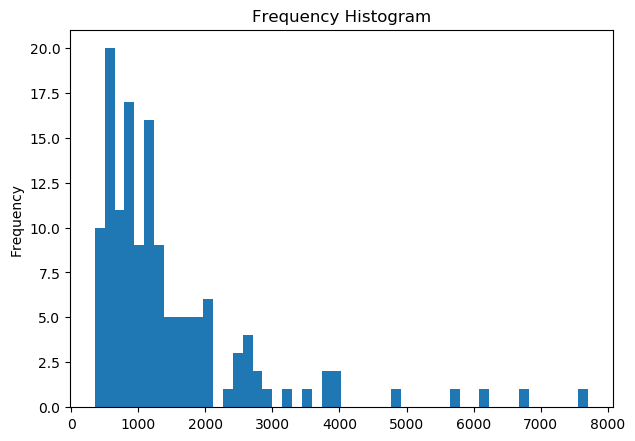

In [25]:
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

plt.hist(hoods, bins=50)
plt.gca().set(title='Frequency Histogram', ylabel='Frequency');

In [26]:
data = go.Bar(
    x=hoods.index,
    y=hoods.values
)

layout = go.Layout(
    title='Crime Distribution by Neighbourhood (2014 - 2019)'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

# Crime Types

#### Number of crimes by type

In [27]:
crime_types = df['MCI'].value_counts()

crime_types

Assault            110609
Break and Enter     43214
Auto Theft          23330
Robbery             21500
Theft Over           6668
Name: MCI, dtype: int64

In [28]:
data = go.Bar(
    x=crime_types.index,
    y=crime_types.values
)

layout = go.Layout(
    title='Crime Types Distribution (2014 - 2019)'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

### Crime by type over time

In [29]:
df['MCI'].unique()

array(['Assault', 'Break and Enter', 'Robbery', 'Theft Over',
       'Auto Theft'], dtype=object)

In [30]:
robbery_date = df \
    [df['MCI'] == 'Robbery'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

auto_date = df \
    [df['MCI'] == 'Auto Theft'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

assault_date = df \
    [df['MCI'] == 'Assault'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

theft_date = df \
    [df['MCI'] == 'Theft Over'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')

BE_date = df \
    [df['MCI'] == 'Break and Enter'] \
    .groupby(['occurrenceyear', 'occurrencemonth'], as_index=False) \
    .agg({'occurrencedate': 'min', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'}) \
    .sort_values('occurrencedate')


In [31]:
trace_robbery = go.Scatter(
    x=robbery_date['occurrencedate'],
    y=robbery_date['count'],
    name = 'Robbery' 
)    

trace_auto = go.Scatter(
    x=auto_date['occurrencedate'],
    y=auto_date['count'],
    name = 'Auto Theft'
)    

trace_assault= go.Scatter(
    x=assault_date['occurrencedate'],
    y=assault_date['count'],
    name = 'Assault'
)

trace_theft= go.Scatter(
    x=theft_date['occurrencedate'],
    y=theft_date['count'],
    name = 'Theft Over'
)

trace_BE= go.Scatter(
    x=BE_date['occurrencedate'],
    y=BE_date['count'],
    name = 'Break and Enter'
)

data = [trace_robbery, trace_auto, trace_assault, trace_theft, trace_BE]

py.iplot(data)

##### Frequency Distribution by crime type

In [32]:
hood_crimetype = df.groupby(['Neighbourhood', 'MCI'], as_index=False) \
    .agg({'event_unique_id': 'count'}) \
    .rename(columns={'event_unique_id': 'count'})
    #.sort_values('occurrencedate')

hood_crimetype.head()

,Neighbourhood,MCI,count
0,Agincourt North (129),Assault,447
1,Agincourt North (129),Auto Theft,178
2,Agincourt North (129),Break and Enter,320
3,Agincourt North (129),Robbery,181
4,Agincourt North (129),Theft Over,28


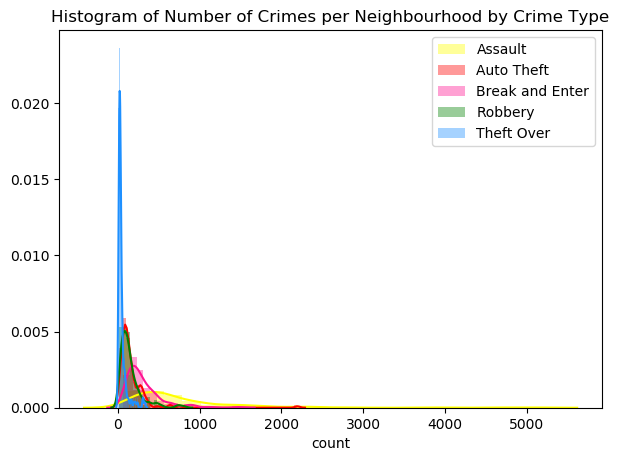

In [33]:
plt.subplots(figsize=(7,5), dpi=100)
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Assault', "count"] , color="yellow", label="Assault")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Auto Theft', "count"] , color="red", label="Auto Theft")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Break and Enter', "count"] , color="deeppink", label="Break and Enter")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Robbery', "count"] , color="green", label="Robbery")
sn.distplot( hood_crimetype.loc[hood_crimetype.MCI=='Theft Over', "count"] , color="dodgerblue", label="Theft Over")


plt.title('Histogram of Number of Crimes per Neighbourhood by Crime Type')
plt.legend();

#### Descriptive Statistics by Crime Type

In [34]:
mci_hood = pd.pivot_table(df, values="event_unique_id", index=['Neighbourhood'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

mci_hood

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
Neighbourhood,,,,,
Agincourt North (129),447,178,320,181,28
Agincourt South-Malvern West (128),690,220,479,163,80
Alderwood (20),216,97,148,41,41
Annex (95),1476,132,884,245,170
Banbury-Don Mills (42),479,131,438,90,60
...,...,...,...,...,...
Wychwood (94),421,79,204,83,13
Yonge-Eglinton (100),453,54,168,117,28
Yonge-St.Clair (97),185,26,140,34,24


In [35]:
mci_hood[["Assault","Auto Theft", "Break and Enter", "Robbery", "Theft Over" ]].describe()

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
count,140.000000,140.000000,140.000000,140.000000,140.000000
mean,790.064286,166.642857,308.671429,153.571429,47.628571
std,770.681173,209.722704,220.220179,138.867057,55.913389
min,111.000000,16.000000,63.000000,20.000000,7.000000
25%,354.750000,79.750000,167.750000,70.250000,20.750000
50%,576.500000,112.500000,244.500000,120.500000,30.500000
75%,952.000000,186.000000,386.250000,182.250000,49.250000
max,5091.000000,2195.000000,1482.000000,812.000000,334.000000


## Crime by Premise Type

#### Number of crimes by premise type

In [36]:
premise_types = df['premisetype'].value_counts()

premise_types

Outside       54158
Apartment     49530
Commercial    40955
House         37589
Other         23089
Name: premisetype, dtype: int64

In [37]:
data = go.Bar(
    x=premise_types.index,
    y=premise_types.values
)

layout = go.Layout(
    title='Crime by Premise Type Distribution (2014 - 2019)'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

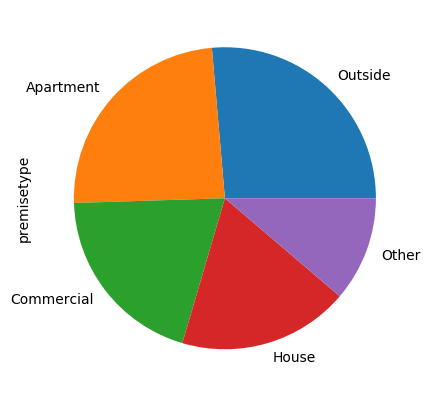

In [38]:
df['premisetype'].value_counts().plot(kind='pie')

#### Crime type by premise type

In [39]:
premise = pd.pivot_table(df, values="event_unique_id", index=['premisetype'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

premise

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
premisetype,,,,,
Apartment,34454,518,11616,1946,996
Commercial,17542,2362,13657,5056,2338
House,13863,6640,15299,640,1147
Other,17635,607,2618,1741,488
Outside,27115,13203,24,12117,1699


##### See report for chart

In [40]:
premise.to_csv("2_Output/premise_MCI_table.csv")

### Time of Day Transformation

In [41]:
timeframes = [ \
            (df['occurrencehour'] >=0) & (df['occurrencehour'] <=3), \
            (df['occurrencehour'] >3) & (df['occurrencehour'] <=7), \
            (df['occurrencehour'] >7) & (df['occurrencehour'] <=11), \
            (df['occurrencehour'] >11) & (df['occurrencehour'] <=15), \
            (df['occurrencehour'] >15) & (df['occurrencehour'] <=19), \
            (df['occurrencehour'] >19) & (df['occurrencehour'] <=23)]

In [42]:
time_values = ['Late Night', 'Morning', 'Late Morning', 'Afternoon', 'Evening', 'Night']

In [43]:
df['TOD'] = np.select(timeframes, time_values)

In [44]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId,TOD
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1,Night
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2,Night
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3,Night
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4,Night
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5,Night


In [45]:
tod_table = pd.pivot_table(df, values="event_unique_id", index=['TOD'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

tod_table

MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
TOD,,,,,
Afternoon,22078,3037,7697,3826,1728
Evening,23016,5084,7190,4802,1538
Late Morning,15200,2531,7548,1599,1010
Late Night,20488,3268,8596,4083,1010
Morning,7083,1862,6056,1263,334
Night,22744,7548,6127,5927,1048


In [46]:
tod_table.to_csv("2_Output/tod_table.csv")

##### See report for chart

ConversionError: Failed to convert value(s) to axis units: Index(['Afternoon', 'Evening', 'Late Morning', 'Late Night', 'Morning',
       'Night'],
      dtype='object', name='TOD')

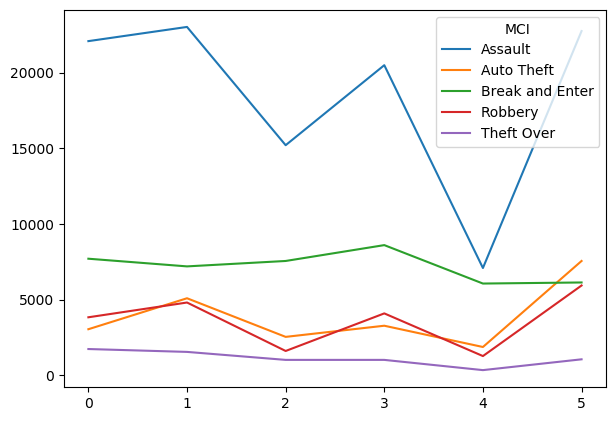

In [47]:
ax = tod_table.plot(xticks=tod_table.index)
ylab = ax.set_ylabel('MCI')
xlab = ax.set_xlabel('TOD')

##### Total Crime by Day of Week - see report for break out by crime type done in excel

In [50]:
fig = px.histogram(df, y="occurrencedayofweek",color="occurrencedayofweek")
fig.update_layout(
    title_text='Crime count on each day', 
    xaxis_title_text='Day',
    yaxis_title_text='Crimes Count', 
    bargap=0.2, 
    bargroupgap=0.1
)
fig.show()

# PLANNING

## Reviewing aggregated data

#### Aggregate by year, month, day, time

##### Counts of crime are too low for prediction models

In [51]:
Agg_ymdt = df.groupby([\
            'Hood_ID', 'Neighbourhood', 'occurrenceyear','occurrencemonth', \
            'occurrencedayofweek','TOD'], as_index=False) \
            .agg({'event_unique_id': 'count'}) \
            .rename(columns={'event_unique_id': 'count'}) \
            .sort_values(by=['Hood_ID','count'], ascending=False)

Agg_ymdt

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,occurrencedayofweek,TOD,count
126301,140,Guildwood (140),2014.0,February,Sunday,Night,5
126530,140,Guildwood (140),2018.0,February,Tuesday,Evening,5
126296,140,Guildwood (140),2014.0,December,Sunday,Night,4
126363,140,Guildwood (140),2015.0,February,Sunday,Night,4
126414,140,Guildwood (140),2016.0,December,Monday,Night,4
...,...,...,...,...,...,...,...
2332,1,West Humber-Clairville (1),2019.0,September,Sunday,Late Night,1
2333,1,West Humber-Clairville (1),2019.0,September,Sunday,Morning,1
2337,1,West Humber-Clairville (1),2019.0,September,Tuesday,Afternoon,1
2342,1,West Humber-Clairville (1),2019.0,September,Wednesday,Late Morning,1


#### Aggregate by year and month

##### Crime counts by year and month are too low for prediction models, only 100 records with more than 100 crimes

In [52]:
Agg_ym = df.groupby([\
            'Hood_ID', 'Neighbourhood', 'occurrenceyear','occurrencemonth'] \
            , as_index=False) \
            .agg({'event_unique_id': 'count'}) \
            .rename(columns={'event_unique_id': 'count'}) \
            .sort_values(by=['count','Hood_ID'], ascending=False)

Agg_ym

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,count
5386,75,Church-Yonge Corridor (75),2019.0,June,176
5505,77,Waterfront Communities-The Island (77),2017.0,July,155
5530,77,Waterfront Communities-The Island (77),2019.0,June,154
5458,76,Bay Street Corridor (76),2019.0,June,154
5523,77,Waterfront Communities-The Island (77),2018.0,September,146
...,...,...,...,...,...
907,13,Etobicoke West Mall (13),2017.0,September,1
929,13,Etobicoke West Mall (13),2019.0,November,1
292,5,Elms-Old Rexdale (5),2014.0,January,1
177,3,Thistletown-Beaumond Heights (3),2016.0,November,1


In [53]:
Agg_ym.to_csv("2_Output\Agg_ym_test.csv")

In [54]:
Agg_ym.shape

(10061, 5)

In [55]:
Agg_ym[Agg_ym['count'] >= 100]

,Hood_ID,Neighbourhood,occurrenceyear,occurrencemonth,count
5386,75,Church-Yonge Corridor (75),2019.0,June,176
5505,77,Waterfront Communities-The Island (77),2017.0,July,155
5530,77,Waterfront Communities-The Island (77),2019.0,June,154
5458,76,Bay Street Corridor (76),2019.0,June,154
5523,77,Waterfront Communities-The Island (77),2018.0,September,146
...,...,...,...,...,...
5366,75,Church-Yonge Corridor (75),2017.0,October,101
5245,73,Moss Park (73),2019.0,November,101
45,1,West Humber-Clairville (1),2017.0,November,101
5492,77,Waterfront Communities-The Island (77),2016.0,January,100


### Map crimes by neighbourhood

Display interactive maps
Get mapbox api key:
https://www.mapbox.com/studio

In [56]:
mapbox_access_token = 'pk.eyJ1IjoibmhhdDQxNiIsImEiOiJjazBhYTlrZjgwaGtnM2hwcXkxdHVidXd1In0.ewuvGQgnflGsUYb6feZzbA'

In [57]:
neighbourhoods = df \
    .groupby('Neighbourhood') \
    .agg({'Lat': 'mean', 'Long': 'mean', 'MCI': 'count'}) \
    .rename(columns={'MCI': 'count'})

In [58]:
neighbourhoods

,Lat,Long,count
Neighbourhood,,,
Agincourt North (129),43.807288,-79.270261,1154
Agincourt South-Malvern West (128),43.788147,-79.266615,1632
Alderwood (20),43.605258,-79.542029,543
Annex (95),43.670535,-79.401907,2907
Banbury-Don Mills (42),43.735631,-79.346256,1198
...,...,...,...
Wychwood (94),43.678670,-79.425899,800
Yonge-Eglinton (100),43.705352,-79.400793,820
Yonge-St.Clair (97),43.688536,-79.396760,409


In [59]:
data = [
    go.Scattermapbox(
        lat=neighbourhoods['Lat'],
        lon=neighbourhoods['Long'],
        mode='markers',
        marker = {
            'size': neighbourhoods['count'] / 5,
            'sizemode': 'area',
            'color': neighbourhoods['count'] / 5,
            'colorscale': 'Viridis',
            'opacity': 0.9
        }
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=43.6532,
            lon=-79.3832
        ),
        pitch=0,
        zoom=9
    ),
)

fig = dict(data=data, layout=layout)

py.iplot(fig)

# Independent Variables

## City of Toronto Open data and KSI Toronto Police

In [60]:
features = pd.read_csv("1_open_Data\INDICATORS_final.csv")

In [61]:
features.head()

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
0,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3.014532e+07,...,550,310,170,15,6,37,950,0,1,5
1,Mount Olive-Silverstone-Jamestown,2,32954,813.3,267.0,109.2,9.1,166.9,27.3,4.637542e+06,...,462,26,52,13,103,4,1288,1,3,4
2,Thistletown-Beaumond Heights,3,10360,714.3,482.6,125.5,0.0,67.6,29.0,3.339481e+06,...,90,14,31,5,30,9,372,1,3,5
3,Rexdale-Kipling,4,10529,588.8,474.9,142.5,19.0,218.4,28.5,2.505576e+06,...,121,9,29,1,15,3,308,0,3,6
4,Elms-Old Rexdale,5,9456,708.5,296.1,105.8,0.0,148.1,42.3,2.931145e+06,...,81,9,1,4,14,2,358,0,3,8


In [62]:
features.dtypes

Neighbourhood               object
Hood_ID                      int64
Population                   int64
Assault_Rate_2019          float64
AutoTheft_Rate_2019        float64
BreakandEnter_Rate_2019    float64
Homicide_Rate_2019         float64
Robbery_Rate_2019          float64
TheftOver_Rate_2019        float64
Shape__Area                float64
Shape__Length              float64
Assault                      int64
Auto Theft                   int64
Break and Enter              int64
Robbery                      int64
Theft Over                   int64
KSI                          int64
TotalYouthServices           int64
CommunityHousing             int64
PlacesOfWorship              int64
SocialHousing                int64
TPSFacilities_2km            int64
TPSFacilities_5km            int64
TPSFacilities_10km           int64
dtype: object

#### No missing values

In [51]:
features.isnull().sum()

Hood_ID               0
KSI                   0
TotalYouthServices    0
CommunityHousing      0
PlacesOfWorship       0
SocialHousing         0
TPSFacilities_2km     0
TPSFacilities_5km     0
TPSFacilities_10km    0
dtype: int64

#### Number of neighbourhoods in independent variables

In [64]:
features.shape

(140, 24)

In [65]:
df.dtypes

X                                  float64
Y                                  float64
Index_                               int64
event_unique_id                     object
occurrencedate         datetime64[ns, UTC]
occ_date                            object
reporteddate                        object
premisetype                         object
ucr_code                             int64
ucr_ext                              int64
offence                             object
reportedyear                         int64
reportedmonth                       object
reportedday                          int64
reporteddayofyear                    int64
reporteddayofweek                   object
reportedhour                         int64
occurrenceyear                     float64
occurrencemonth                     object
occurrenceday                      float64
occurrencedayofyear                float64
occurrencedayofweek                 object
occurrencehour                       int64
MCI        

In [66]:
df.head()

,X,Y,Index_,event_unique_id,occurrencedate,occ_date,reporteddate,premisetype,ucr_code,ucr_ext,...,occurrencedayofweek,occurrencehour,MCI,Division,Hood_ID,Neighbourhood,Lat,Long,ObjectId,TOD
0,-8840548.681,5431712.281,201,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,1,Night
1,-8840548.681,5431712.281,202,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,2,Night
2,-8840548.681,5431712.281,203,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,3,Night
3,-8840548.681,5431712.281,204,GO-20141301077,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Other,1420,100,...,Tuesday,22,Assault,D32,36,Newtonbrook West (36),43.781639,-79.416,4,Night
4,-8839880.764,5413805.692,205,GO-20141300854,2014-01-07 05:00:00+00:00,2014/01/07,2014/01/07 05:00:00+00,Commercial,2120,200,...,Tuesday,21,Break and Enter,D14,79,University (79),43.665390,-79.410,5,Night


### Aggregate MCI counts to neighbourhood

### Total MCIs

In [67]:
df_agg = df.groupby(['Hood_ID'], as_index=True) \
    .agg({'event_unique_id': 'count'}) \
    .rename(columns={'event_unique_id': 'count'}) \
    .sort_values('count', ascending=False)

df_agg.head()

,count
Hood_ID,
77,7707
76,6800
75,6217
1,5680
73,4768


### Count of each Crime Type per neighbourhood

In [68]:
table = pd.pivot_table(df, values="event_unique_id", index=['Hood_ID'],\
                      columns=['MCI'],\
                      aggfunc=lambda x: x.count())

table
    


MCI,Assault,Auto Theft,Break and Enter,Robbery,Theft Over
Hood_ID,,,,,
1,1799,2195,826,550,310
2,1516,374,193,462,26
3,320,152,114,90,14
4,412,172,95,121,9
5,325,113,63,81,9
...,...,...,...,...,...
136,2397,159,494,390,38
137,2292,276,628,501,82
138,1117,123,340,243,31


In [69]:
table.to_csv("2_Output\CountMCIbyNeighbourhood.csv")

In [70]:
table = pd.read_csv("2_Output\CountMCIbyNeighbourhood.csv")

##### Check for missing values

In [71]:
table.isnull().sum()

Hood_ID            0
Assault            0
Auto Theft         0
Break and Enter    0
Robbery            0
Theft Over         0
dtype: int64

In [72]:
table.dtypes

Hood_ID            int64
Assault            int64
Auto Theft         int64
Break and Enter    int64
Robbery            int64
Theft Over         int64
dtype: object

In [73]:
table.shape

(140, 6)

## Dependent and Independent Variables

### Join MCIs Target to features

In [74]:
join = pd.merge( \
    table, \
    features, \
    how="left", \
    ##on=None,
    left_on='Hood_ID', \
    right_on='Hood_ID', \
    left_index=False,
    right_index=False,
    sort=True,
    suffixes=("_x", "_y"),
    copy=True,
    indicator=False,
    validate=None,
)

join

,Hood_ID,Assault_x,Auto Theft_x,Break and Enter_x,Robbery_x,Theft Over_x,Neighbourhood,Population,Assault_Rate_2019,AutoTheft_Rate_2019,...,Robbery_y,Theft Over_y,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
0,1,1799,2195,826,550,310,West Humber-Clairville,33312,795.5,1446.9,...,550,310,170,15,6,37,950,0,1,5
1,2,1516,374,193,462,26,Mount Olive-Silverstone-Jamestown,32954,813.3,267.0,...,462,26,52,13,103,4,1288,1,3,4
2,3,320,152,114,90,14,Thistletown-Beaumond Heights,10360,714.3,482.6,...,90,14,31,5,30,9,372,1,3,5
3,4,412,172,95,121,9,Rexdale-Kipling,10529,588.8,474.9,...,121,9,29,1,15,3,308,0,3,6
4,5,325,113,63,81,9,Elms-Old Rexdale,9456,708.5,296.1,...,81,9,1,4,14,2,358,0,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,136,2397,159,494,390,38,West Hill,27392,1573.5,164.3,...,390,38,31,15,26,11,2052,1,1,4
136,137,2292,276,628,501,82,Woburn,53485,798.4,112.2,...,501,82,161,32,26,27,2594,0,2,7
137,138,1117,123,340,243,31,Eglinton East,22776,851.8,122.9,...,243,31,57,10,12,4,885,0,2,8
138,139,1000,103,248,150,16,Scarborough Village,16724,1046.4,107.6,...,150,16,36,2,3,5,788,0,2,5


In [75]:
join.shape

(140, 29)

In [76]:
join.isnull().sum()

Hood_ID                    0
Assault_x                  0
Auto Theft_x               0
Break and Enter_x          0
Robbery_x                  0
Theft Over_x               0
Neighbourhood              0
Population                 0
Assault_Rate_2019          0
AutoTheft_Rate_2019        0
BreakandEnter_Rate_2019    0
Homicide_Rate_2019         0
Robbery_Rate_2019          0
TheftOver_Rate_2019        0
Shape__Area                0
Shape__Length              0
Assault_y                  0
Auto Theft_y               0
Break and Enter_y          0
Robbery_y                  0
Theft Over_y               0
KSI                        0
TotalYouthServices         0
CommunityHousing           0
PlacesOfWorship            0
SocialHousing              0
TPSFacilities_2km          0
TPSFacilities_5km          0
TPSFacilities_10km         0
dtype: int64

##### Scatter plot

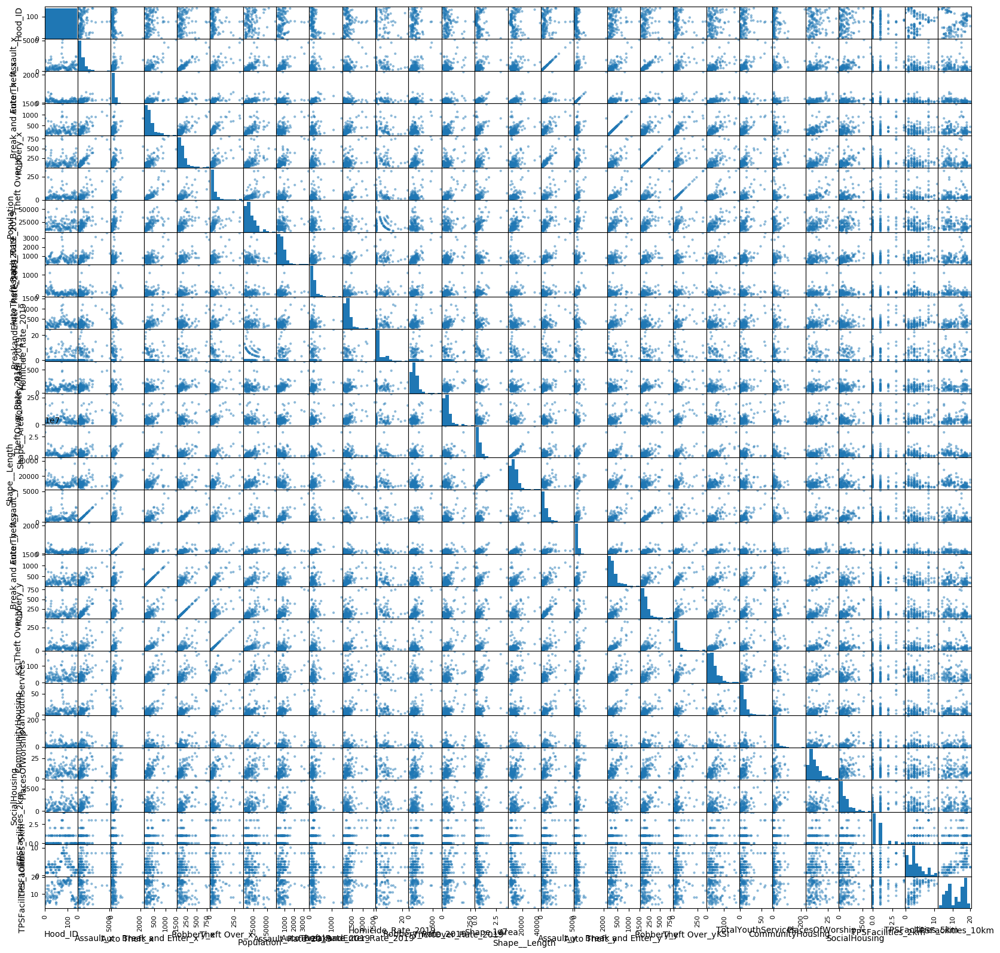

In [77]:
pd.plotting.scatter_matrix(join, figsize=(20, 20));

##### Correlation Matrix

In [78]:
rs = np.random.RandomState(0)
df = pd.DataFrame(rs.rand(10, 10))
corr = join.corr()
corr.style.background_gradient(cmap='coolwarm')

,Hood_ID,Assault_x,Auto Theft_x,Break and Enter_x,Robbery_x,Theft Over_x,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length,Assault_y,Auto Theft_y,Break and Enter_y,Robbery_y,Theft Over_y,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
Hood_ID,1.000000,0.098353,-0.231519,0.120985,0.094567,-0.084750,0.114776,0.093376,-0.356087,0.073372,0.024641,0.034885,-0.149822,-0.033339,-0.061257,0.098353,-0.231519,0.120985,0.094567,-0.084750,0.096794,0.098788,0.021738,0.017663,0.103208,0.012357,0.129036,0.106841
Assault_x,0.098353,1.000000,0.344037,0.817875,0.887734,0.784943,0.647259,0.772257,0.121440,0.424874,0.179684,0.582195,0.519781,0.285325,0.274986,1.000000,0.344037,0.817875,0.887734,0.784943,0.682985,0.806997,0.259127,0.326312,0.680218,0.359375,0.252286,-0.086214
Auto Theft_x,-0.231519,0.344037,1.000000,0.414998,0.474792,0.629618,0.417485,0.120062,0.801790,0.048602,0.139997,0.181783,0.390617,0.683654,0.504815,0.344037,1.000000,0.414998,0.474792,0.629618,0.583455,0.193417,0.062426,0.559074,0.153339,-0.059682,-0.168456,-0.284210
Break and Enter_x,0.120985,0.817875,0.414998,1.000000,0.758961,0.858357,0.682233,0.551337,0.164378,0.614351,0.030233,0.454309,0.579147,0.393602,0.362795,0.817875,0.414998,1.000000,0.758961,0.858357,0.749181,0.751746,0.123872,0.504116,0.561575,0.293644,0.296234,-0.018925
Robbery_x,0.094567,0.887734,0.474792,0.758961,1.000000,0.720308,0.581505,0.763483,0.268499,0.438045,0.239519,0.729813,0.515221,0.316312,0.267291,0.887734,0.474792,0.758961,1.000000,0.720308,0.666689,0.800629,0.283257,0.436176,0.673028,0.273097,0.177181,-0.137916
Theft Over_x,-0.084750,0.784943,0.629618,0.858357,0.720308,1.000000,0.586916,0.527207,0.410593,0.451736,0.085450,0.425985,0.753178,0.484962,0.401636,0.784943,0.629618,0.858357,0.720308,1.000000,0.755983,0.676037,0.085783,0.492125,0.411975,0.236683,0.226934,-0.052627
Population,0.114776,0.647259,0.417485,0.682233,0.581505,0.586916,1.000000,0.131399,0.049480,0.013145,-0.052978,0.051684,0.116931,0.594691,0.540154,0.647259,0.417485,0.682233,0.581505,0.586916,0.750375,0.431380,0.273493,0.391122,0.457527,0.047046,-0.054536,-0.258641
Assault_Rate_2019,0.093376,0.772257,0.120062,0.551337,0.763483,0.527207,0.131399,1.000000,0.111812,0.632030,0.303787,0.798418,0.599344,-0.065625,-0.055703,0.772257,0.120062,0.551337,0.763483,0.527207,0.340211,0.772953,0.208734,0.214219,0.611932,0.486976,0.377407,0.083418
AutoTheft_Rate_2019,-0.356087,0.121440,0.801790,0.164378,0.268499,0.410593,0.049480,0.111812,1.000000,0.066064,0.315384,0.213401,0.424827,0.460370,0.334764,0.121440,0.801790,0.164378,0.268499,0.410593,0.326092,0.049570,-0.020453,0.434877,-0.014488,-0.032350,-0.196538,-0.286342
BreakandEnter_Rate_2019,0.073372,0.424874,0.048602,0.614351,0.438045,0.451736,0.013145,0.632030,0.066064,1.000000,0.106913,0.537921,0.598864,-0.090450,-0.094030,0.424874,0.048602,0.614351,0.438045,0.451736,0.248621,0.626668,0.072451,0.324409,0.361844,0.496667,0.550292,0.307724


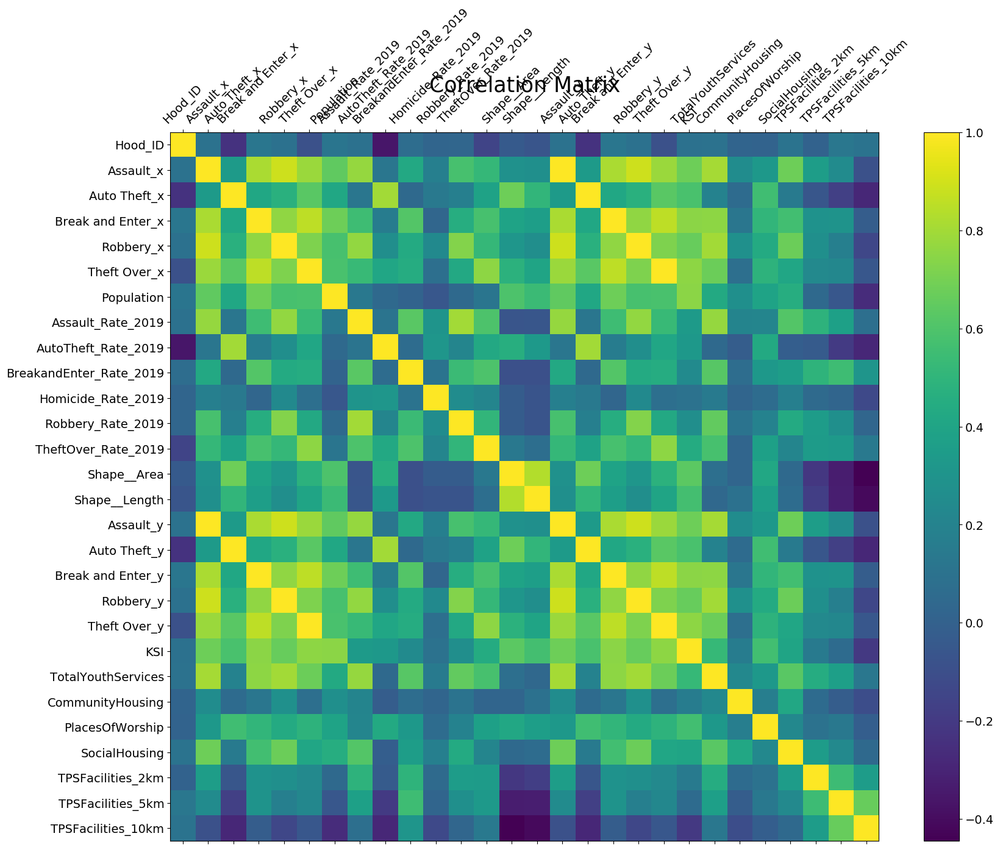

In [80]:
f = plt.figure(figsize=(19, 15))
plt.matshow(join.corr(), fignum=f.number)
plt.xticks(range(join.select_dtypes(['number']).shape[1]), join.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(join.select_dtypes(['number']).shape[1]), join.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=25);

##### Population

In [82]:
Dataset_x_Y = pd.read_csv("1_open_Data\Dataset_x_Y.csv")

In [132]:
Dataset_x_Y.describe()

,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length,...,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
count,140.0000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,1.400000e+02,140.000000,...,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,70.5000,19511.221429,714.346429,185.565000,305.550714,2.987143,122.813571,47.132143,4.589400e+06,10138.063215,...,153.571429,47.628571,40.757143,9.357143,14.792857,10.050000,641.085714,0.714286,3.692857,11.742857
std,40.5586,10033.589222,498.301136,169.631765,216.778588,4.812197,86.312788,41.478434,4.665326e+06,5545.517459,...,138.867057,55.913389,34.499269,11.667499,27.208890,7.155342,653.986904,0.961756,2.425572,5.005567
min,1.0000,6577.000000,161.100000,26.100000,67.500000,0.000000,7.500000,0.000000,4.241968e+05,2574.408515,...,20.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,35.7500,12019.500000,392.300000,102.800000,173.575000,0.000000,70.350000,22.750000,1.861853e+06,6372.358386,...,70.250000,20.750000,18.000000,1.000000,1.000000,5.000000,168.250000,0.000000,2.000000,7.750000
50%,70.5000,16749.500000,592.600000,147.200000,258.600000,0.000000,104.200000,37.400000,3.290879e+06,8962.102935,...,120.500000,30.500000,30.500000,7.000000,5.000000,8.000000,474.000000,0.000000,3.000000,11.000000
75%,105.2500,23854.500000,875.675000,199.250000,361.225000,5.725000,148.575000,54.650000,5.402335e+06,11899.512708,...,182.250000,49.250000,52.750000,12.250000,16.000000,13.000000,894.250000,1.000000,5.000000,17.000000
max,140.0000,65913.000000,3550.800000,1446.900000,1549.200000,24.200000,668.100000,283.000000,3.753449e+07,43080.724700,...,812.000000,334.000000,185.000000,74.000000,228.000000,37.000000,3399.000000,4.000000,11.000000,20.000000


In [133]:
Dataset_x_Y.shape

(140, 24)

In [136]:
Dataset_x_Y.isnull().sum()

Neighbourhood              0
Hood_ID                    0
Population                 0
Assault_Rate_2019          0
AutoTheft_Rate_2019        0
BreakandEnter_Rate_2019    0
Homicide_Rate_2019         0
Robbery_Rate_2019          0
TheftOver_Rate_2019        0
Shape__Area                0
Shape__Length              0
Assault                    0
Auto Theft                 0
Break and Enter            0
Robbery                    0
Theft Over                 0
KSI                        0
TotalYouthServices         0
CommunityHousing           0
PlacesOfWorship            0
SocialHousing              0
TPSFacilities_2km          0
TPSFacilities_5km          0
TPSFacilities_10km         0
dtype: int64

### Independent features, more EDA

In [139]:
x_Y_features = Dataset_x_Y.iloc[:,[1,16,17,18,19,20,21,22,23]]

In [140]:
x_Y_features.describe()

,Hood_ID,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
count,140.0000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,70.5000,40.757143,9.357143,14.792857,10.050000,641.085714,0.714286,3.692857,11.742857
std,40.5586,34.499269,11.667499,27.208890,7.155342,653.986904,0.961756,2.425572,5.005567
min,1.0000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,35.7500,18.000000,1.000000,1.000000,5.000000,168.250000,0.000000,2.000000,7.750000
50%,70.5000,30.500000,7.000000,5.000000,8.000000,474.000000,0.000000,3.000000,11.000000
75%,105.2500,52.750000,12.250000,16.000000,13.000000,894.250000,1.000000,5.000000,17.000000
max,140.0000,185.000000,74.000000,228.000000,37.000000,3399.000000,4.000000,11.000000,20.000000


### Popluation by neighbourhood

In [83]:
data = go.Bar(
    x=Dataset_x_Y['Population'].index,
    y=Dataset_x_Y['Population'].values
)

layout = go.Layout(
    title='Population by Neighbourhood ID'
    
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

### Total Youth Services

In [84]:
data = go.Bar(
    x=Dataset_x_Y['TotalYouthServices'].index,
    y=Dataset_x_Y['TotalYouthServices'].values
)

layout = go.Layout(
    title='Total number of Youth Services by Neighbourhood ID'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

##### Number of neighbourhoods with no Youth service locations

In [143]:
Dataset_x_Y[Dataset_x_Y['TotalYouthServices'] == 0]

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing,TPSFacilities_2km,TPSFacilities_5km,TPSFacilities_10km
7,Humber Heights-Westmount,8,10948,319.7,182.7,173.5,0.0,18.3,45.7,2.802680e+06,...,34,19,29,0,18,9,688,0,1,13
8,Edenbridge-Humber Valley,9,15535,212.4,148.1,347.6,0.0,32.2,51.5,5.511578e+06,...,35,26,34,0,0,5,0,0,3,15
9,Princess-Rosethorn,10,11051,244.3,262.4,307.7,0.0,135.7,27.1,5.171203e+06,...,81,22,6,0,0,6,0,0,1,10
10,Eringate-Centennial-West Deane,11,18588,236.7,220.6,107.6,5.4,64.6,26.9,8.645508e+06,...,93,25,18,0,7,8,0,0,1,7
14,Kingsway South,15,9271,302.0,302.0,269.7,0.0,129.4,43.1,2.638301e+06,...,71,22,13,0,0,4,0,1,4,13
18,Long Branch,19,10084,585.1,119.0,287.6,0.0,297.5,19.8,2.261880e+06,...,87,14,17,0,0,9,106,0,3,5
19,Alderwood,20,12054,298.7,116.1,215.7,0.0,41.5,58.1,4.978488e+06,...,41,41,27,0,1,7,77,0,4,5
22,Pelmo Park-Humberlea,23,10722,736.8,671.5,205.2,9.3,74.6,65.3,4.276048e+06,...,100,29,22,0,1,7,359,0,3,8
38,Bedford Park-Nortown,39,23236,266.8,284.0,383.0,0.0,64.6,77.5,5.518149e+06,...,78,66,51,0,1,23,236,0,4,13
44,Parkwoods-Donalda,45,34805,454.0,91.9,195.4,2.9,103.4,14.4,7.464327e+06,...,177,37,20,0,12,6,805,2,4,9


### Places of Worship

In [85]:
data = go.Bar(
    x=Dataset_x_Y['PlacesOfWorship'].index,
    y=Dataset_x_Y['PlacesOfWorship'].values
)

layout = go.Layout(
    title='Places of Worship by Neighbourhood ID'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

##### Number of neighbourhoods with no Places of Worship locations

In [398]:
Dataset_x_Y[Dataset_x_Y['PlacesOfWorship'] == 0]

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing
48,Bayview Woods-Steeles,49,13154,342.1,136.8,152.0,7.6,38.0,15.2,4088934.056,...,242,88,175,22,11,26,1,4,0,174


### Community Housing

In [86]:
data = go.Bar(
    x=Dataset_x_Y['CommunityHousing'].index,
    y=Dataset_x_Y['CommunityHousing'].values
)

layout = go.Layout(
    title='Number of Community Housing buildings by Neighbourhood ID'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

##### Number of neighbourhoods with no Community Housing locations

In [400]:
Dataset_x_Y[Dataset_x_Y['CommunityHousing'] == 0]

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing
8,Edenbridge-Humber Valley,9,15535,212.4,148.1,347.6,0.0,32.2,51.5,5.511578e+06,...,163,138,270,35,26,34,0,0,5,0
9,Princess-Rosethorn,10,11051,244.3,262.4,307.7,0.0,135.7,27.1,5.171203e+06,...,144,134,181,81,22,6,0,0,6,0
11,Markland Wood,12,10554,161.1,85.3,246.4,0.0,113.7,28.4,2.953752e+06,...,124,74,154,47,13,7,2,0,4,0
14,Kingsway South,15,9271,302.0,302.0,269.7,0.0,129.4,43.1,2.638301e+06,...,154,99,149,71,22,13,0,0,4,0
15,Stonegate-Queensway,16,25051,327.3,135.7,255.5,0.0,87.8,16.0,7.946202e+06,...,495,172,316,124,36,39,7,0,12,129
18,Long Branch,19,10084,585.1,119.0,287.6,0.0,297.5,19.8,2.261880e+06,...,367,74,180,87,14,17,0,0,9,106
28,Maple Leaf,29,10111,306.6,257.1,148.4,0.0,49.5,39.6,2.526427e+06,...,190,91,76,31,15,3,1,0,2,175
35,Newtonbrook West,36,23831,717.6,243.4,226.6,0.0,54.6,50.4,4.695676e+06,...,872,270,346,132,60,29,9,0,9,380
37,Lansing-Westgate,38,16164,445.4,198.0,241.3,0.0,68.1,68.1,5.346186e+06,...,422,142,233,88,41,31,10,0,10,0
40,Bridle Path-Sunnybrook-York Mills,41,9266,474.9,118.7,550.4,0.0,140.3,32.4,8.838192e+06,...,167,52,293,20,25,18,18,0,2,43


### SOcial Housing Unit Density

In [87]:
data = go.Bar(
    x=Dataset_x_Y['SocialHousing'].index,
    y=Dataset_x_Y['SocialHousing'].values
)

layout = go.Layout(
    title='Number of Social Housing Units by Neighbourhood ID'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

##### Number of neighbourhoods with no Social Housing Units

In [402]:
Dataset_x_Y[Dataset_x_Y['SocialHousing'] == 0]

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,...,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing
8,Edenbridge-Humber Valley,9,15535,212.4,148.1,347.6,0.0,32.2,51.5,5511577.791,...,163,138,270,35,26,34,0,0,5,0
9,Princess-Rosethorn,10,11051,244.3,262.4,307.7,0.0,135.7,27.1,5171203.324,...,144,134,181,81,22,6,0,0,6,0
10,Eringate-Centennial-West Deane,11,18588,236.7,220.6,107.6,5.4,64.6,26.9,8645508.050,...,321,178,167,93,25,18,0,7,8,0
11,Markland Wood,12,10554,161.1,85.3,246.4,0.0,113.7,28.4,2953752.218,...,124,74,154,47,13,7,2,0,4,0
14,Kingsway South,15,9271,302.0,302.0,269.7,0.0,129.4,43.1,2638301.220,...,154,99,149,71,22,13,0,0,4,0
37,Lansing-Westgate,38,16164,445.4,198.0,241.3,0.0,68.1,68.1,5346185.896,...,422,142,233,88,41,31,10,0,10,0
45,Pleasant View,46,15818,278.2,151.7,75.9,0.0,94.8,25.3,2967493.126,...,271,81,118,71,23,33,0,0,2,0
49,Newtonbrook East,50,16097,410.0,167.7,329.3,0.0,74.5,49.7,4084780.919,...,397,70,298,54,31,65,1,1,10,0
55,Leaside-Bennington,56,16828,184.2,190.2,261.5,0.0,11.9,41.6,4784766.467,...,195,109,200,45,30,46,0,0,7,0
96,Yonge-St.Clair,97,12528,295.3,47.9,223.5,0.0,31.9,47.9,1161314.728,...,185,26,140,34,24,9,0,0,5,0


#### KSI - killed or seriously injured independent variable

In [90]:
KSI = pd.read_csv("1_open_Data\KSI.csv",parse_dates=['DATE'])

In [389]:
KSI.head()

,X,Y,Index_,ACCNUM,YEAR,DATE,TIME,HOUR,STREET1,STREET2,...,EMERG_VEH,PASSENGER,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,DISABILITY,Hood_ID,Neighbourhood,ObjectId
0,-8.829728e+06,5.419071e+06,3389067,893184,2006,2006-01-01 05:00:00+00:00,236,2,WOODBINE AVE,O CONNOR DR,...,NaN,Yes,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden (60),1
1,-8.829728e+06,5.419071e+06,3389068,893184,2006,2006-01-01 05:00:00+00:00,236,2,WOODBINE AVE,O CONNOR DR,...,NaN,Yes,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden (60),2
2,-8.829728e+06,5.419071e+06,3389069,893184,2006,2006-01-01 05:00:00+00:00,236,2,WOODBINE AVE,O CONNOR DR,...,NaN,Yes,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden (60),3
3,-8.829728e+06,5.419071e+06,3389070,893184,2006,2006-01-01 05:00:00+00:00,236,2,WOODBINE AVE,O CONNOR DR,...,NaN,Yes,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden (60),4
4,-8.829728e+06,5.419071e+06,3389071,893184,2006,2006-01-01 05:00:00+00:00,236,2,WOODBINE AVE,O CONNOR DR,...,NaN,Yes,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden (60),5


In [385]:
ksi_hood_count = KSI.groupby('Neighbourhood')['ObjectId'].count()
ksi_hood_count

Neighbourhood
Agincourt North (129)                 174
Agincourt South-Malvern West (128)    158
Alderwood (20)                         71
Annex (95)                            215
Banbury-Don Mills (42)                175
                                     ... 
Wychwood (94)                         104
Yonge-Eglinton (100)                   57
Yonge-St.Clair (97)                    50
York University Heights (27)          241
Yorkdale-Glen Park (31)               114
Name: ObjectId, Length: 140, dtype: int64

In [386]:
print("Avg KSI occurrences per neighbourhood")
ksi_hood_count.mean()/6

Avg KSI occurrences per neighbourhood


19.158333333333335

In [91]:
KSI_hoods = KSI['Neighbourhood'].value_counts()
KSI_hoods

Waterfront Communities-The Island (77)    601
West Humber-Clairville (1)                504
Bay Street Corridor (76)                  379
Rouge (131)                               374
Woburn (137)                              359
                                         ... 
Highland Creek (134)                       27
Lawrence Park North (105)                  24
Maple Leaf (29)                            20
Guildwood (140)                            19
Lambton Baby Point (114)                   11
Name: Neighbourhood, Length: 140, dtype: int64

In [92]:
data = go.Bar(
    x=KSI_hoods.index,
    y=KSI_hoods.values
)

layout = go.Layout(
    title='Killed or Seriously Injured by Neighbourhood (2014 - 2019)'
)

fig = go.Figure(data=[data], layout=layout)

py.iplot(fig)

### MCI 2019 RATEs by Neighbourhood

In [120]:
MCI_rates = pd.read_csv('1_open_Data/Neighbourhood_Crime_Rates_Reduced.csv')

In [121]:
MCI_rates.head()

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length
0,Yonge-St.Clair,97,12528,295.3,47.9,223.5,0.0,31.9,47.9,1.161315e+06,5873.270582
1,York University Heights,27,27593,1340.9,521.9,391.4,0.0,286.3,101.5,1.324666e+07,18504.777330
2,Lansing-Westgate,38,16164,445.4,198.0,241.3,0.0,68.1,68.1,5.346186e+06,11112.109620
3,Yorkdale-Glen Park,31,14804,1411.8,412.1,567.4,6.8,283.7,195.9,6.038326e+06,10079.426920
4,Stonegate-Queensway,16,25051,327.3,135.7,255.5,0.0,87.8,16.0,7.946202e+06,11853.189880


In [221]:
join_mci_RATES_2019 = pd.merge( \
    MCI_rates, \
    features, \
    how="left", \
    ##on=None,
    left_on='Hood_ID', \
    right_on='Hood_ID', \
    left_index=False,
    right_index=False,
    sort=True,
    suffixes=("_x", "_y"),
    copy=True,
    indicator=False,
    validate=None,
)

join_mci_RATES_2019

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing
0,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3.014532e+07,27924.196970,170,15,6,37,950
1,Mount Olive-Silverstone-Jamestown,2,32954,813.3,267.0,109.2,9.1,166.9,27.3,4.637542e+06,12954.664120,52,13,103,4,1288
2,Thistletown-Beaumond Heights,3,10360,714.3,482.6,125.5,0.0,67.6,29.0,3.339481e+06,10828.444480,31,5,30,9,372
3,Rexdale-Kipling,4,10529,588.8,474.9,142.5,19.0,218.4,28.5,2.505576e+06,7067.058509,29,1,15,3,308
4,Elms-Old Rexdale,5,9456,708.5,296.1,105.8,0.0,148.1,42.3,2.931145e+06,9356.687072,1,4,14,2,358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,West Hill,136,27392,1573.5,164.3,284.8,7.3,259.2,14.6,9.625440e+06,14976.571770,31,15,26,11,2052
136,Woburn,137,53485,798.4,112.2,187.0,0.0,125.3,15.0,1.233407e+07,18111.264990,161,32,26,27,2594
137,Eglinton East,138,22776,851.8,122.9,254.7,8.8,118.5,35.1,3.223146e+06,10012.866980,57,10,12,4,885
138,Scarborough Village,139,16724,1046.4,107.6,239.2,0.0,167.4,12.0,3.151015e+06,7922.764442,36,2,3,5,788


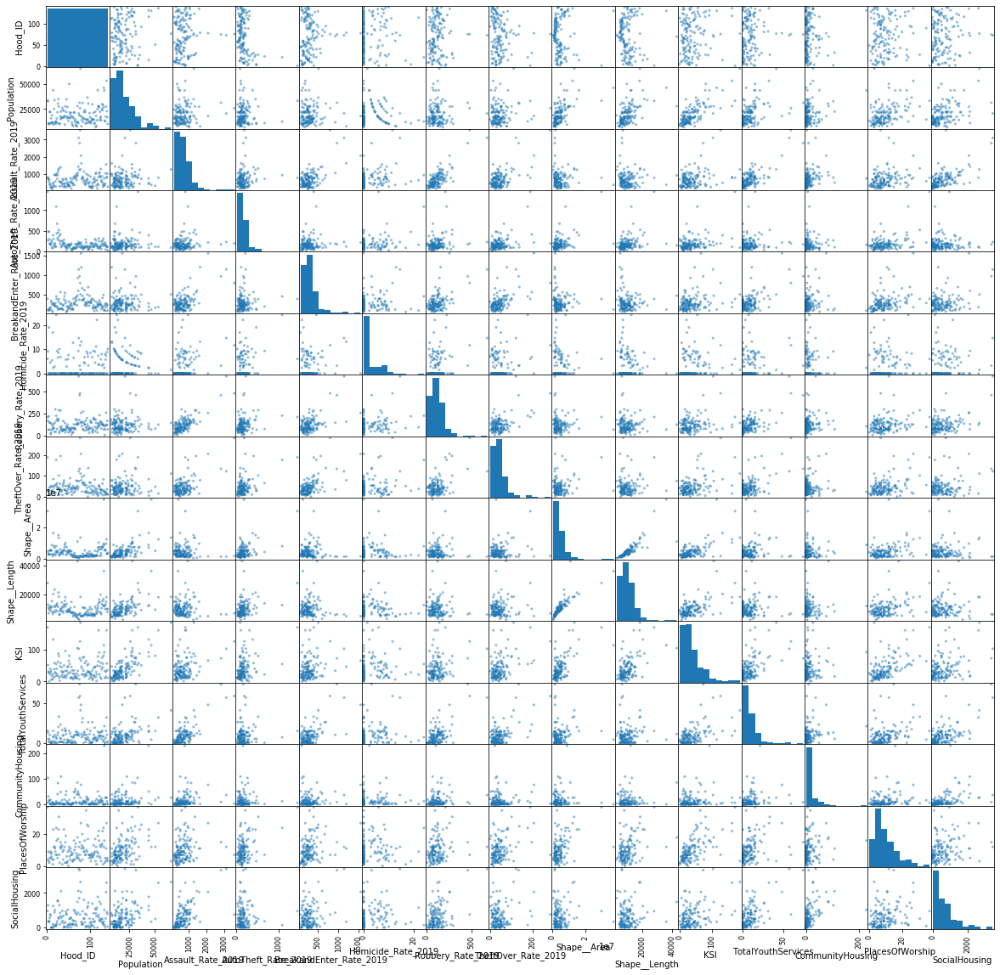

In [222]:
pd.plotting.scatter_matrix(join_mci_RATES_2019, figsize=(20, 20));

In [132]:
join_mci_RATES_2019.describe()

,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length,TotalYouthServices,CommunityHousing,SocialHousing,PlacesOfWorship,KSI
count,140.0000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,1.400000e+02,140.000000,116.000000,116.000000,116.000000,116.000000,116.000000
mean,70.5000,19511.221429,714.346429,185.565000,305.550714,2.987143,122.813571,47.132143,4.589400e+06,10138.063215,11.293103,16.931034,725.612069,10.750000,44.508621
std,40.5586,10033.589222,498.301136,169.631765,216.778588,4.812197,86.312788,41.478434,4.665326e+06,5545.517459,11.936803,29.087491,677.986325,7.434204,36.411774
min,1.0000,6577.000000,161.100000,26.100000,67.500000,0.000000,7.500000,0.000000,4.241968e+05,2574.408515,0.000000,0.000000,0.000000,0.000000,1.000000
25%,35.7500,12019.500000,392.300000,102.800000,173.575000,0.000000,70.350000,22.750000,1.861853e+06,6372.358386,4.000000,1.000000,243.250000,5.000000,19.000000
50%,70.5000,16749.500000,592.600000,147.200000,258.600000,0.000000,104.200000,37.400000,3.290879e+06,8962.102935,9.000000,6.000000,521.500000,9.000000,33.500000
75%,105.2500,23854.500000,875.675000,199.250000,361.225000,5.725000,148.575000,54.650000,5.402335e+06,11899.512708,14.000000,19.250000,1011.000000,14.000000,58.000000
max,140.0000,65913.000000,3550.800000,1446.900000,1549.200000,24.200000,668.100000,283.000000,3.753449e+07,43080.724700,74.000000,228.000000,3399.000000,37.000000,185.000000


In [136]:
join_mci_RATES_2019.head()

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Shape__Area,Shape__Length,TotalYouthServices,CommunityHousing,SocialHousing,PlacesOfWorship,KSI
0,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3.014532e+07,27924.196970,15.0,6.0,950.0,37.0,170.0
1,Mount Olive-Silverstone-Jamestown,2,32954,813.3,267.0,109.2,9.1,166.9,27.3,4.637542e+06,12954.664120,13.0,103.0,1288.0,4.0,52.0
2,Thistletown-Beaumond Heights,3,10360,714.3,482.6,125.5,0.0,67.6,29.0,3.339481e+06,10828.444480,5.0,30.0,372.0,9.0,31.0
3,Rexdale-Kipling,4,10529,588.8,474.9,142.5,19.0,218.4,28.5,2.505576e+06,7067.058509,1.0,15.0,308.0,3.0,29.0
4,Elms-Old Rexdale,5,9456,708.5,296.1,105.8,0.0,148.1,42.3,2.931145e+06,9356.687072,4.0,14.0,358.0,2.0,1.0


In [160]:
join_mci_RATES_2019.dtypes

Neighbourhood               object
Hood_ID                      int64
Population                   int64
Assault_Rate_2019          float64
AutoTheft_Rate_2019        float64
BreakandEnter_Rate_2019    float64
Homicide_Rate_2019         float64
Robbery_Rate_2019          float64
TheftOver_Rate_2019        float64
Shape__Area                float64
Shape__Length              float64
TotalYouthServices         float64
CommunityHousing           float64
SocialHousing              float64
PlacesOfWorship            float64
KSI                        float64
dtype: object

In [182]:
join_mci_RATES_2019.isnull().sum()

Neighbourhood               0
Hood_ID                     0
Population                  0
Assault_Rate_2019           0
AutoTheft_Rate_2019         0
BreakandEnter_Rate_2019     0
Homicide_Rate_2019          0
Robbery_Rate_2019           0
TheftOver_Rate_2019         0
Shape__Area                 0
Shape__Length               0
TotalYouthServices         24
CommunityHousing           24
SocialHousing              24
PlacesOfWorship            24
KSI                        24
dtype: int64

In [290]:
join_mci.head()

,Hood_ID,Assault,Auto Theft,Break and Enter,Robbery,Theft Over,KSI,TotalYouthServices,CommunityHousing,PlacesOfWorship,SocialHousing
0,1,1799,2195,826,550,310,170,15,6,37,950
1,2,1516,374,193,462,26,52,13,103,4,1288
2,3,320,152,114,90,14,31,5,30,9,372
3,4,412,172,95,121,9,29,1,15,3,308
4,5,325,113,63,81,9,1,4,14,2,358
